In [5]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import ElasticNet
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor,AdaBoostRegressor
from PIL import Image
%matplotlib inline
%config InlineBackend.figure_fornat = 'retina'
pd.set_option('display.max_rows',2000)
pd.set_option('display.max_columns',2000)

In [2]:
data = np.load('all_processed_data.npz')
lst = data.files
for item in lst:
    print(item)
    print(data[item])

X
[[-0.00864469  0.0006357   0.01244438 ...  0.20125262  0.24801245
   0.22432554]
 [ 0.0018402   0.00993099  0.02183564 ...  0.37911781  0.43591616
   0.46893506]
 [ 0.13422352  0.13921366  0.14955479 ...  0.18717591  0.15615716
   0.12713   ]
 ...
 [ 0.05029795  0.06236732  0.0761603  ...  0.30991094  0.30719812
   0.26446351]
 [ 0.0201164   0.03192383  0.04508201 ...  0.27126067  0.22192419
   0.22990213]
 [ 0.01482185  0.02738802  0.04101932 ...  0.22819835  0.19387345
   0.19890692]]
y
[[1.         0.         0.        ]
 [0.         1.         0.        ]
 [0.         0.         1.        ]
 ...
 [0.06008469 0.65929652 0.28061879]
 [0.34946664 0.36030602 0.29022734]
 [0.31033173 0.50012997 0.1895383 ]]


In [3]:
X = data['X']
y = data['y']
print(X.shape)
print(y.shape)
X.dtype

(400, 540)
(400, 3)


dtype('float64')

In [4]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2, train_size=0.8)

In [7]:
#Linear
model_Linear = LinearRegression()
model_Ridge = Ridge()
model_Lasso = Lasso()
model_ElasticNet = ElasticNet()
model_RandomForestRegressor = RandomForestRegressor()

In [8]:
model_Linear.fit(X_train,y_train)
model_Ridge.fit(X_train,y_train)
model_Lasso.fit(X_train,y_train)
model_ElasticNet.fit(X_train,y_train)
model_RandomForestRegressor.fit(X_train,y_train)

RandomForestRegressor()

In [10]:
from sklearn.metrics import mean_squared_error,r2_score
y_pred_Linear = model_Linear.predict(X_test)
y_pred_Ridge = model_Ridge.predict(X_test)
y_pred_Lasso = model_Lasso.predict(X_test)
y_pred_ElasticNet = model_ElasticNet.predict(X_test)
y_pred_RandomForestRegressor =model_RandomForestRegressor.predict(X_test)
## MSE
MSE_Linear = mean_squared_error(y_test,y_pred_Linear)
MSE_Ridge = mean_squared_error(y_test,y_pred_Ridge)
MSE_Lasso = mean_squared_error(y_test,y_pred_Lasso)
MSE_ElasticNet = mean_squared_error(y_test,y_pred_ElasticNet)
MSE_RandomForestRegressor = mean_squared_error(y_test,y_pred_RandomForestRegressor)

#R-Square
R2_Linear = r2_score(y_test,y_pred_Linear)
R2_Ridge = r2_score(y_test,y_pred_Ridge)
R2_Lasso = r2_score(y_test,y_pred_Lasso)
R2_ElasticNet = r2_score(y_test,y_pred_ElasticNet)
R2_RandomForestRegressor = r2_score(y_test,y_pred_RandomForestRegressor)


In [11]:
print('MSE_Linear :',MSE_Linear)
print('MSE_Ridge :',MSE_Ridge)
print('MSE_Lasso :',MSE_Lasso)
print('MSE_ElasticNet :',MSE_ElasticNet)
print('MSE_RandomForestRegressor : ',MSE_RandomForestRegressor)

MSE_Linear : 0.0036410932641377743
MSE_Ridge : 0.0010818414669769572
MSE_Lasso : 0.0716980083443717
MSE_ElasticNet : 0.0716980083443717
MSE_RandomForestRegressor :  0.001681731706004227


In [12]:
print('R2_Linear : ',R2_Linear)
print('R2_Ridge :',R2_Ridge)
print('R2_Lasso :',R2_Lasso)
print('R2_ElasticNet : ',R2_ElasticNet)
print('R2_RandomForestRegressor : ',R2_RandomForestRegressor)

R2_Linear :  0.9490789881442884
R2_Ridge : 0.9852340302208756
R2_Lasso : -0.019118879515053495
R2_ElasticNet :  -0.019118879515053495
R2_RandomForestRegressor :  0.9767533383724175


In [4]:
for k in np.arange(0,400,1):
    spec = X[k,:]

In [12]:
df = pd.DataFrame(spec)
df

,0
0,0.014822
1,0.027388
2,0.041019
3,0.053389
4,0.051319
5,0.039197
6,0.041636
7,0.042632
8,0.034930
9,0.020072


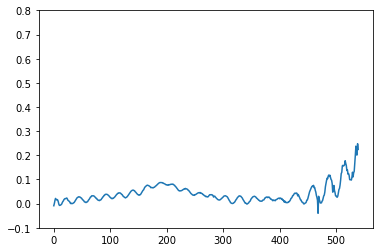

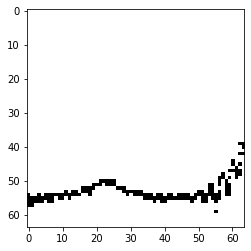

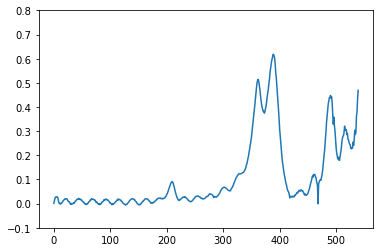

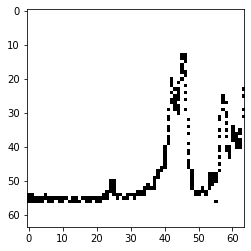

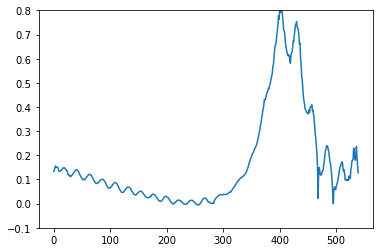

...

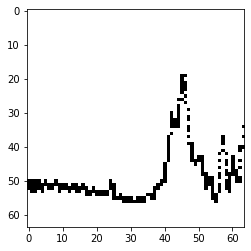

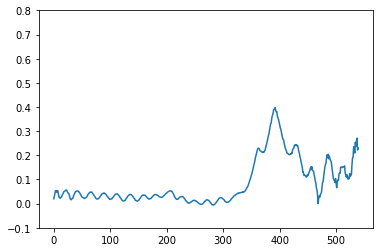

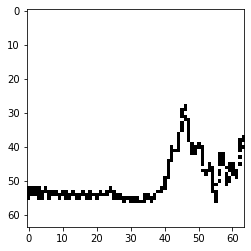

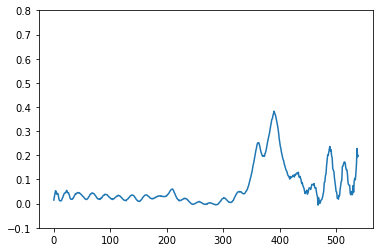

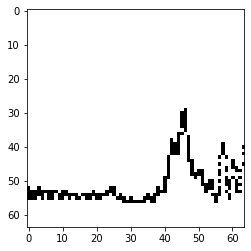

In [7]:
import matplotlib.pyplot as plt
import numpy as np
from numpy import save

for k in np.arange(0,400,1):
    spec = X[k,:]

    x_min = 0
    x_max = len(spec)
 

    y_min = -0.1 # min amplitude of spectrum <please specify>
    y_max = 0.8 # max amplitude of spectrum <please specify>
 
    image_width = 64 # image width
    image_height = 64 # image height
 
    I = np.ones((image_height, image_width))

    for i in np.arange(len(spec)):
        x_spec = i
        y_spec = spec[i]
     
        x_img = np.int(np.round((x_spec-x_min)/(x_max-x_min)*(image_width-1)))
        y_img = np.int(np.round((image_height-1) - (y_spec-y_min)/(y_max-y_min)*(image_height-1)), )
        I[y_img, x_img] = 0 
    plt.plot(spec)
    plt.ylim((y_min, y_max))
    plt.show()
    plt.imshow(I,cmap='gray')
    save_results_to = '/Users/HP/Desktop/Data/DataAnalysis_raman/spectrum400pic_Xfixed/'
    save(save_results_to + f'sepctrum{k}.npy',I)
    plt.show()

In [133]:
print(ax)

AxesImage(112.68,36;217.44x217.44)


In [123]:
print(I)

(64, 64)


In [51]:
df_X

0     -0.008645
1      0.000636
2      0.012444
3      0.021545
4      0.018831
5      0.015604
6      0.016842
7      0.014596
8      0.007306
9     -0.002784
10    -0.007387
11    -0.006624
12    -0.006039
13    -0.004047
14    -0.001665
15     0.004141
16     0.008647
17     0.011609
18     0.016709
19     0.019267
20     0.020946
21     0.020572
22     0.021731
23     0.023352
24     0.019530
25     0.014034
26     0.011993
27     0.009919
28     0.008346
29     0.003005
30     0.000329
31     0.001574
32    -0.000107
33     0.000323
34     0.001203
35     0.003508
36     0.004441
37     0.008395
38     0.012683
39     0.016335
40     0.020691
41     0.023430
42     0.025380
43     0.026670
44     0.028423
45     0.027702
46     0.027902
47     0.025976
48     0.024052
49     0.023025
50     0.019586
51     0.016095
52     0.014638
53     0.012380
54     0.007930
55     0.006620
56     0.006219
57     0.004371
58     0.006164
59     0.006973
60     0.008482
61     0.013109
62     0

In [4]:
print(X.shape)
print(y.shape)

(400, 540)
(400, 3)


In [10]:
df_X = pd.DataFrame(X)
df_X

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,...,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539
0,-0.008645,0.000636,0.012444,0.021545,0.018831,0.015604,0.016842,0.014596,0.007306,-0.002784,-0.007387,-0.006624,-0.006039,-0.004047,-0.001665,0.004141,0.008647,0.011609,0.016709,0.019267,0.020946,0.020572,0.021731,0.023352,0.019530,0.014034,0.011993,0.009919,0.008346,0.003005,0.000329,0.001574,-0.000107,0.000323,0.001203,0.003508,0.004441,0.008395,0.012683,0.016335,0.020691,0.023430,0.025380,0.026670,0.028423,0.027702,0.027902,0.025976,0.024052,0.023025,...,0.109382,0.100138,0.096785,0.083069,0.047436,0.051895,0.075238,0.054877,0.046192,0.032603,0.032053,0.027631,0.026724,0.031886,0.046561,0.058795,0.062989,0.077373,0.098447,0.124176,0.129883,0.156448,0.158533,0.155981,0.157779,0.160884,0.177630,0.166543,0.158327,0.137114,0.139946,0.122053,0.124579,0.116949,0.099375,0.099193,0.098575,0.097641,0.109696,0.130155,0.110584,0.127839,0.133600,0.164143,0.200264,0.238123,0.202413,0.201253,0.248012,0.224326
1,0.001840,0.009931,0.021836,0.027200,0.026470,0.027606,0.028603,0.025325,0.014974,0.004033,-0.000071,0.001190,-0.001825,0.001651,0.001900,0.006219,0.010589,0.011760,0.015938,0.017747,0.020357,0.019163,0.019735,0.020404,0.016910,0.011007,0.009923,0.007029,0.006850,0.000584,-0.003143,0.000694,-0.001233,-0.001107,-0.000390,0.003872,0.001193,0.005548,0.010170,0.011417,0.015227,0.017860,0.018145,0.019330,0.021778,0.017971,0.020327,0.018070,0.015390,0.015909,...,0.448141,0.436258,0.441981,0.417447,0.367942,0.328636,0.357860,0.323049,0.299875,0.267063,0.231740,0.208650,0.197339,0.184660,0.192362,0.179819,0.179496,0.195430,0.212868,0.226016,0.251575,0.268916,0.279111,0.281498,0.294332,0.320794,0.303817,0.306598,0.306337,0.285925,0.290867,0.266001,0.263570,0.252286,0.246442,0.242322,0.228532,0.227104,0.231610,0.230233,0.254435,0.241486,0.264032,0.303980,0.286016,0.295151,0.362908,0.379118,0.435916,0.468935
2,0.134224,0.139214,0.149555,0.155576,0.152019,0.150304,0.150402,0.150313,0.144726,0.135991,0.133523,0.133885,0.134494,0.138006,0.139363,0.143989,0.146563,0.146852,0.149011,0.148112,0.146627,0.142062,0.139104,0.138016,0.131045,0.123709,0.120294,0.116600,0.117015,0.112404,0.111802,0.115658,0.116637,0.119785,0.124113,0.126892,0.128892,0.132922,0.137572,0.139744,0.139891,0.140175,0.137622,0.134450,0.131203,0.125452,0.121317,0.116365,0.110966,0.108207,...,0.165489,0.143371,0.121841,0.088261,0.043598,-0.000421,0.055966,0.067646,0.068249,0.057479,0.069916,0.076044,0.086414,0.094341,0.111464,0.123853,0.140441,0.152873,0.154686,0.167557,0.170687,0.173014,0.151427,0.134243,0.140528,0.125165,0.098108,0.099651,0.099396,0.095396,0.097928,0.101680,0.096827,0.114566,0.107373,0.104203,0.137896,0.153243,0.177001,0.178002,0.184064,0.230360,0.222053,0.196240,0.179876,0.204973,0.236648,0.187176,0.156157,0.127130
3,0.008239,0.014291,0.025328,0.036217,0.030618,0.023189,0.023275,0.023266,0.020550,0.011683,0.007230,0.006208,0.008644,0.011183,0.013671,0.018086,0.020938,0.023731,0.027472,0.028078,0.028071,0.026170,0.023866,0.025291,0.018958,0.013045,0.009594,0.006879,0.006782,0.002471,0.002551,0.003514,0.004394,0.007698,0.011694,0.010760,0.016003,0.019201,0.022533,0.026745,0.026992,0.029478,0.029058,0.027474,0.025135,0.023584,0.018144,0.015071,0.012475,0.008834,...,0.414870,0.394595,0.398615,0.373594,0.329084,0.286701,0.334207,0.314006,0.277224,0.268848,0.254598,0.240760,0.242519,0.221817,0.239218,0.236779,0.248810,0.253690,0.272643,0.289872,0.298016,0.305613,0.305448,0.311176,0.302395,0.297546,0.290798,0.276474,0.280998,0.278085,0.261302,0.254521,0.262483,0.268861,0.248069,0.258501,0.255755,0.271902,0.297261,0.300250,0.306184,0.339132,0.359011,0.387238,0.445195,0.477841,0.485009,0.500333,0.466084,0.448631
4,-0.000145,0.00

In [4]:
df_y = pd.DataFrame(y)
df_y

,0,1,2
0,1.000000,0.000000,0.000000
1,0.000000,1.000000,0.000000
2,0.000000,0.000000,1.000000
3,0.100551,0.899449,0.000000
4,0.200314,0.799686,0.000000
...,...,...,...
395,0.169717,0.629948,0.200335
396,0.759248,0.150333,0.090419
397,0.060085,0.659297,0.280619
398,0.349467,0.360306,0.290227


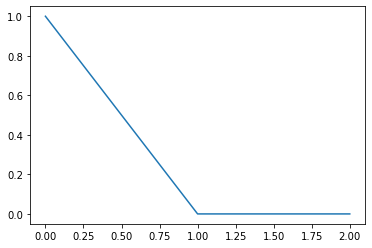

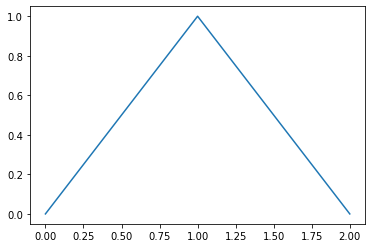

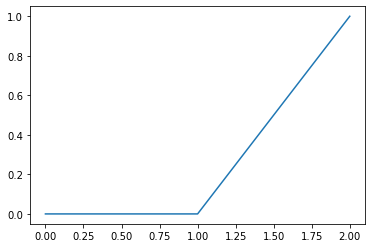

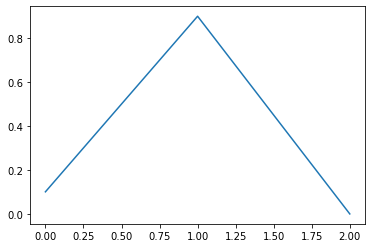

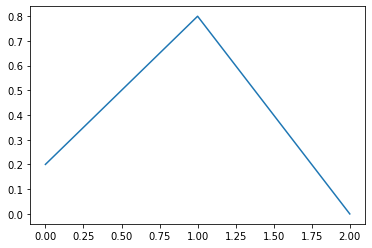

...

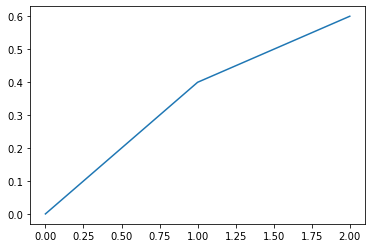

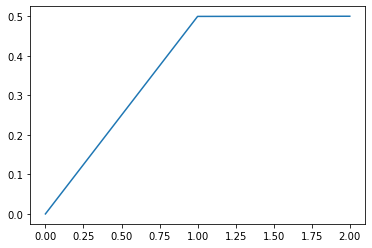

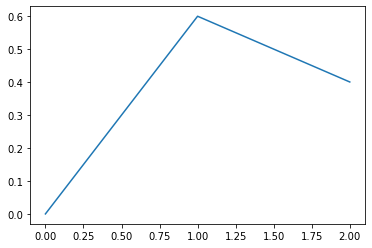

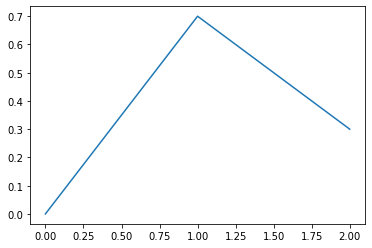

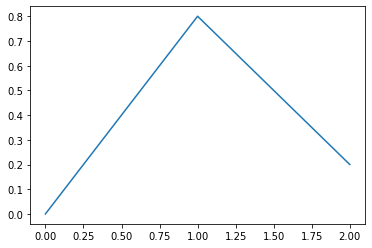

In [7]:
plot = np.arange(0,20,1)
for i in plot:
    fig,ax = plt.subplots()
    ax.plot(y[i,:])

AttributeError: 'numpy.ndarray' object has no attribute 'plot'

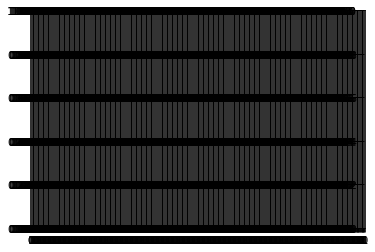

In [5]:
for i in range(1, 7):
    fig,ax= plt.subplots(1,len(X))
    ax.plot(X[0,:])
    ax.set_title('spectrumNo.1')
    figure = plt.gcf()
    figure.set_size_inches(0.9, 0.9)
    plt.savefig("sample.png")

### Input spectra are stored in X variable

<ipython-input-8-17f5ed3f5b24>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax = plt.subplots()


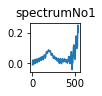

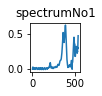

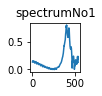

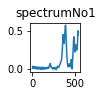

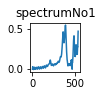

...

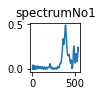

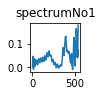

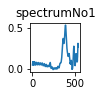

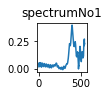

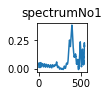

In [8]:
import tempfile
import os
plot = np.arange(0,400,1)
for i in plot:
    fig,ax = plt.subplots()
    ax.plot(X[i,:])
    ax.set_title(f'spectrumNo{i}')
    figure = plt.gcf()
    figure.set_size_inches(0.9, 0.9)
    save_results_to = '/Users/HP/Desktop/Data/DataAnalysis_raman/spectrum400pic_X/'
    plt.savefig(save_results_to + f'spectrum{i}')

###  output concentrations are stored in y variable

<ipython-input-8-99759068a153>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax = plt.subplots()


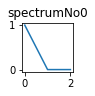

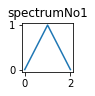

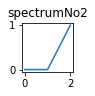

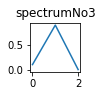

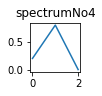

...

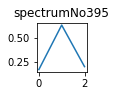

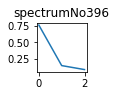

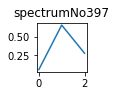

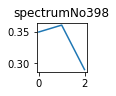

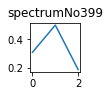

In [8]:
import tempfile
import os
plot = np.arange(0,400,1)
for i in plot:
    fig,ax = plt.subplots()
    ax.plot(y[i,:])
    ax.set_title(f'spectrumNo{i}')
    figure = plt.gcf()
    figure.set_size_inches(0.9, 0.9)
    save_results_to = '/Users/HP/Desktop/Data/DataAnalysis_raman/spectrum400pic_y/'
    plt.savefig(save_results_to + f'spectrum{i}')

In [9]:
import glob, os, sys
from PIL import Image

folder = '/Users/HP/Desktop/Data/DataAnalysis_raman/spectrum400pic_X/'

for filepath in glob.iglob(os.path.join(folder, '*.png')):
    image = Image.open(filepath).convert('RGB')
    new_filepath = os.path.splitext(filepath)[0] + '.bmp'
    image.save(new_filepath)

In [10]:
import glob, os, sys
from PIL import Image

folder = '/Users/HP/Desktop/Data/DataAnalysis_raman/spectrum400pic_y/'

for filepath in glob.iglob(os.path.join(folder, '*.png')):
    image = Image.open(filepath).convert('RGB')
    new_filepath = os.path.splitext(filepath)[0] + '.bmp'
    image.save(new_filepath)

In [38]:
H = df_X.iloc[:,0]
H.shape

(400,)

In [6]:
df_y = pd.DataFrame(y)
df_y

,0,1,2
0,1.000000,0.000000,0.000000
1,0.000000,1.000000,0.000000
2,0.000000,0.000000,1.000000
3,0.100551,0.899449,0.000000
4,0.200314,0.799686,0.000000
...,...,...,...
395,0.169717,0.629948,0.200335
396,0.759248,0.150333,0.090419
397,0.060085,0.659297,0.280619
398,0.349467,0.360306,0.290227


TypeError: Invalid shape (540,) for image data

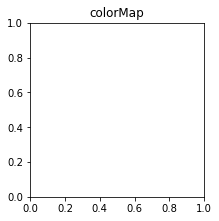

In [32]:
import numpy as np
import matplotlib.pyplot as plt

  # added some commas and array creation code
H = df_X.iloc[0]
fig = plt.figure(figsize=(6, 3.2))

ax = fig.add_subplot(111)
ax.set_title('colorMap')
plt.imshow(H)
ax.set_aspect('equal')

cax = fig.add_axes([0.12, 0.1, 0.78, 0.8])
cax.get_xaxis().set_visible(False)
cax.get_yaxis().set_visible(False)
cax.patch.set_alpha(0)
cax.set_frame_on(False)
plt.colorbar(orientation='vertical')
plt.show()

(400,)
(400, 540)


AttributeError: 'AxesImage' object has no property 'figsize'

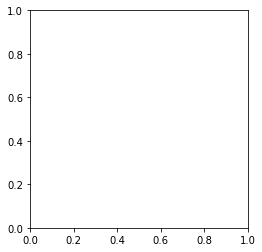

In [47]:
import skimage
import matplotlib
from matplotlib import pyplot as plt
flattened = X[:,0].flatten()
print(flattened.shape)
array = np.column_stack([flattened])
print(X.shape)
plt.imshow(array,figsize=(10,10))
plt.show()

### Remove spike

In [3]:
data = np.load('signal_with_spikes_1.npy')

In [4]:
df = pd.DataFrame(data,columns=['Intensity'])
df.index.name = 'Wavelength'
df

,Intensity
Wavelength,
0,2029.582274
1,2024.980336
2,2007.255129
3,1998.733620
4,2021.382207
5,2055.310855
6,2098.716650
7,2161.972656
8,2202.956562


In [5]:
wavelength = np.array(df.index)
intensity = np.array(df.Intensity)

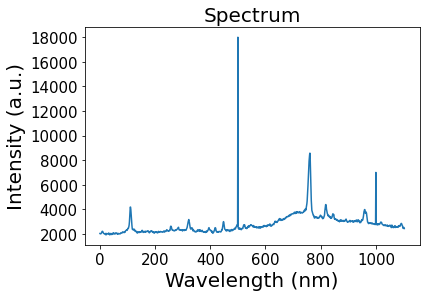

In [6]:
plt.plot(wavelength, intensity)
plt.title('Spectrum', fontsize = 20)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel('Wavelength (nm)', fontsize = 20)
plt.ylabel('Intensity (a.u.)', fontsize = 20)
plt.show()

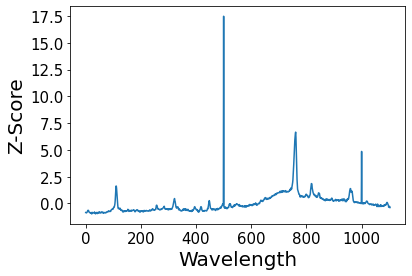

In [7]:
#Let’s calculate the z-scores for the points in our spectrum:
def z_score(intensity):
    mean_int = np.mean(intensity)
    std_int = np.std(intensity)
    z_scores = (intensity - mean_int) / std_int
    return z_scores
intensity_z_score = np.array(z_score(intensity))
plt.plot(wavelength, intensity_z_score)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel( 'Wavelength' ,fontsize = 20)
plt.ylabel( 'Z-Score' ,fontsize = 20)
plt.show()

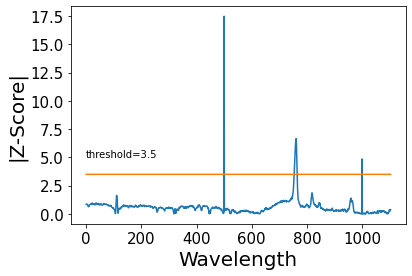

In [28]:
def z_score(intensity):
    mean_int = np.mean(intensity)
    std_int = np.std(intensity)
    z_scores = (intensity - mean_int) / std_int
    return z_scores
threshold = 3.5
intensity_z_score = np.array(abs(z_score(intensity)))
plt.plot(wavelength, intensity_z_score)
plt.plot(wavelength, threshold*np.ones(len(wavelength)), label = 'threshold')
plt.text(0,5,'threshold=3.5')
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel( 'Wavelength' ,fontsize = 20)
plt.ylabel( '|Z-Score|' ,fontsize = 20)
plt.show()

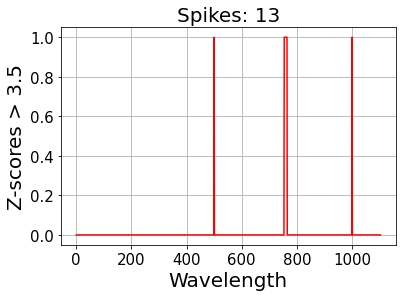

In [13]:
threshold = 3.5
# 1 is assigned to spikes, 0 to non-spikes:
spikes = abs(np.array(z_score(intensity))) > threshold
plt.plot(wavelength, spikes, color = 'red')
plt.title('Spikes: ' + str(np.sum(spikes)), fontsize = 20)
plt.grid()
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel( 'Wavelength' ,fontsize = 20)
plt.ylabel( 'Z-scores > ' + str(threshold) ,fontsize = 20)
plt.show()

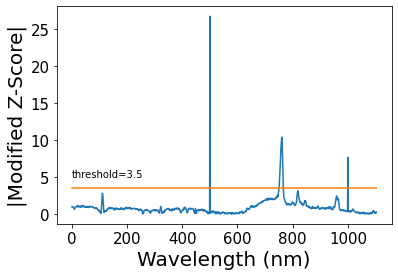

In [39]:
def modified_z_score(intensity):
    median_int = np.median(intensity)
    mad_int = np.median([np.abs(intensity - median_int)])
    modified_z_scores = 0.6745 * (intensity - median_int) / mad_int
    return modified_z_scores
threshold = 3.5
intensity_modified_z_score = np.array(abs(modified_z_score(intensity)))
plt.plot(wavelength, intensity_modified_z_score)
plt.plot(wavelength, threshold*np.ones(len(wavelength)), label = 'threshold')
plt.text(0,5,'threshold=3.5')
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel('Wavelength (nm)' ,fontsize = 20)
plt.ylabel('|Modified Z-Score|' ,fontsize = 20)
plt.show()

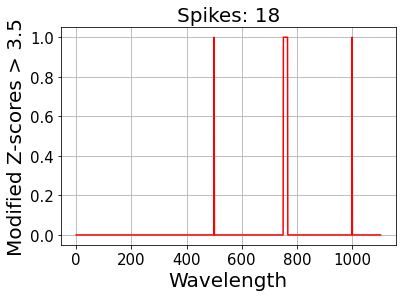

In [40]:
# 1 is assigned to spikes, 0 to non-spikes:
spikes = abs(np.array(modified_z_score(intensity))) > threshold
plt.plot(wavelength,spikes, color = 'red')
plt.title('Spikes: ' + str(np.sum(spikes)), fontsize = 20)
plt.grid()
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel( 'Wavelength' ,fontsize = 20)
plt.ylabel( 'Modified Z-scores > ' + str(threshold) ,fontsize = 20)
plt.show()

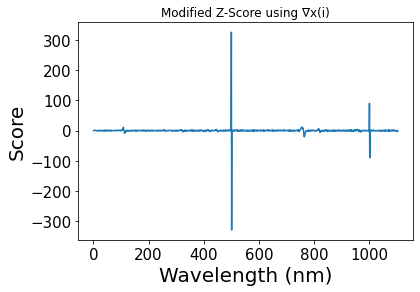

In [17]:
dist = 0
delta_intensity = [] 
for i in np.arange(len(intensity)-1):
    dist = intensity[i+1] - intensity[i]
    delta_intensity.append(dist)

delta_int = np.array(delta_intensity)
# Alternatively to the for loop one can use: 
# delta_int = np.diff(intensity)

intensity_modified_z_score = np.array(modified_z_score(delta_int))
plt.plot(wavelength[1:], intensity_modified_z_score)
plt.title('Modified Z-Score using ∇x(i)')
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel('Wavelength (nm)', fontsize = 20)
plt.ylabel('Score', fontsize = 20)
plt.show()

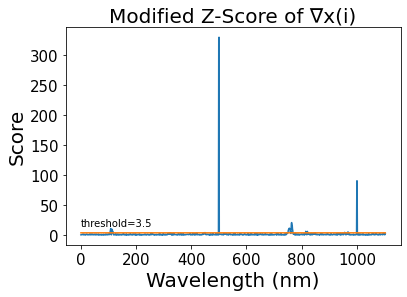

In [41]:
threshold = 3.5
intensity_modified_z_score = np.array(np.abs(modified_z_score(delta_int)))
plt.plot(wavelength[1:], intensity_modified_z_score)
plt.plot(wavelength[1:], threshold*np.ones(len(wavelength[1:])), label = 'threshold')
plt.text(0,15,'threshold=3.5')
plt.title('Modified Z-Score of ∇x(i)', fontsize = 20)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel('Wavelength (nm)', fontsize = 20)
plt.ylabel('Score', fontsize = 20)
plt.show()

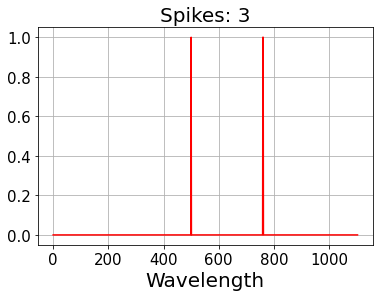

In [36]:
# 1 is assigned to spikes, 0 to non-spikes:
spikes = abs(np.array(modified_z_score(intensity))) > threshold
plt.plot(wavelength, spikes, color = 'red')
plt.title('Spikes: ' + str(np.sum(spikes)), fontsize = 20)
plt.grid()
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel( 'Wavelength' ,fontsize = 20)
#plt.ylabel( ‘Spike(1) or not(0)?’ ,fontsize = 20)
plt.show()

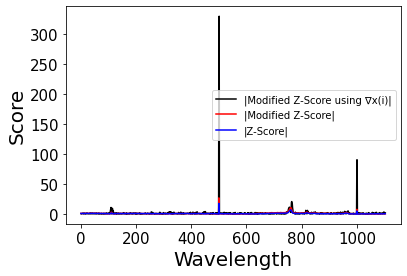

In [52]:
plt.plot(wavelength[1:],
np.array(abs(modified_z_score(delta_int))), color='black', label = '|Modified Z-Score using ∇x(i)|')
plt.plot(wavelength, np.array(abs(modified_z_score(intensity))), label = '|Modified Z-Score|', color = 'red')
plt.plot(wavelength, np.array(abs(z_score(intensity))), label = '|Z-Score|', color = 'blue')
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel( 'Wavelength' ,fontsize = 20)
plt.ylabel( 'Score' ,fontsize = 20)
plt.legend()
plt.show()

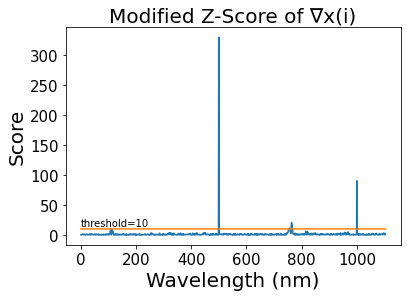

In [30]:
threshold = 10
intensity_modified_z_score = np.array(np.abs(modified_z_score(delta_int)))
plt.plot(wavelength[1:], intensity_modified_z_score)
plt.plot(wavelength[1:], threshold*np.ones(len(wavelength[1:])), label = 'threshold')
plt.title('Modified Z-Score of ∇x(i)', fontsize = 20)
plt.text(0,15,'threshold=')
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel('Wavelength (nm)', fontsize = 20)
plt.ylabel('Score', fontsize = 20)
plt.show()

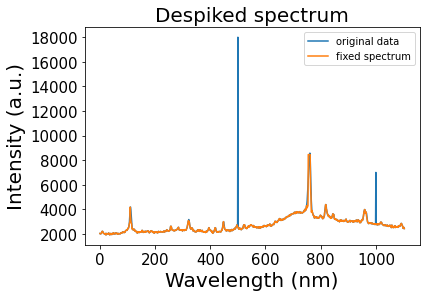

In [107]:
def fixer(y,m):
    threshold = 3.5 # binarization threshold. 
    spikes = abs(np.array(modified_z_score(np.diff(y)))) > threshold
    y_out = y.copy() # So we don’t overwrite y
    for i in np.arange(len(spikes)):
        if spikes[i] != 0: # If we have an spike in position i
            w = np.arange(i-m,i+1+m) # we select 2 m + 1 points around our spike
            w2 = w[spikes[w] == 0] # From such interval, we choose the ones which are not spikes
            y_out[i] = np.mean(y[w2]) # and we average their values
    return y_out
# Does it work?
plt.plot(wavelength, intensity, label = 'original data')
plt.plot(wavelength, fixer(intensity,m=5), label = 'fixed spectrum')
plt.title('Despiked spectrum',fontsize = 20)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel('Wavelength (nm)' ,fontsize = 20)
plt.ylabel('Intensity (a.u.)' ,fontsize = 20)
plt.legend()
plt.show()

## ------------------------------------------------

In [2]:
#read multiple file
import os
import glob
fpath = 'C:/Users/HP/Desktop/Data/DataAnalysis_raman/test_remove_spike/'
read_file = glob.glob(os.path.join(fpath,"*.npy"))
np_array = []
for file in read_file:
    data = np.load(file)
    np_array.append(data)
    print(file)

C:/Users/HP/Desktop/Data/DataAnalysis_raman/test_remove_spike\signal_with_spikes_1.npy
C:/Users/HP/Desktop/Data/DataAnalysis_raman/test_remove_spike\signal_with_spikes_10.npy
C:/Users/HP/Desktop/Data/DataAnalysis_raman/test_remove_spike\signal_with_spikes_2.npy
C:/Users/HP/Desktop/Data/DataAnalysis_raman/test_remove_spike\signal_with_spikes_3.npy
C:/Users/HP/Desktop/Data/DataAnalysis_raman/test_remove_spike\signal_with_spikes_4.npy
C:/Users/HP/Desktop/Data/DataAnalysis_raman/test_remove_spike\signal_with_spikes_5.npy
C:/Users/HP/Desktop/Data/DataAnalysis_raman/test_remove_spike\signal_with_spikes_6.npy
C:/Users/HP/Desktop/Data/DataAnalysis_raman/test_remove_spike\signal_with_spikes_7.npy
C:/Users/HP/Desktop/Data/DataAnalysis_raman/test_remove_spike\signal_with_spikes_8.npy
C:/Users/HP/Desktop/Data/DataAnalysis_raman/test_remove_spike\signal_with_spikes_9.npy


In [30]:
df_1 = pd.DataFrame(np_array[0],columns=['Intensity0'])
df_1.index.name = 'Wavelength0'
df_2 = pd.DataFrame(np_array[1],columns=['Intensity1'])
df_2.index.name = 'Wavelength1'
df_3 = pd.DataFrame(np_array[2],columns=['Intensity2'])
df_3.index.name = 'Wavelength2'
df_4 = pd.DataFrame(np_array[3],columns=['Intensity3'])
df_4.index.name = 'Wavelength3'
df_5 = pd.DataFrame(np_array[4],columns=['Intensity4'])
df_5.index.name = 'Wavelength4'
df_6 = pd.DataFrame(np_array[5],columns=['Intensity5'])
df_6.index.name = 'Wavelength5'
df_7 = pd.DataFrame(np_array[6],columns=['Intensity6'])
df_7.index.name = 'Wavelength6'
df_8 = pd.DataFrame(np_array[7],columns=['Intensity7'])
df_8.index.name = 'Wavelength7'
df_9 = pd.DataFrame(np_array[8],columns=['Intensity8'])
df_9.index.name = 'Wavelength8'
df_10 = pd.DataFrame(np_array[9],columns=['Intensity9'])
df_10.index.name = 'Wavelength9'

In [56]:
df_1

,Intensity0
Wavelength0,
0,2029.582274
1,2024.980336
2,2007.255129
3,1998.733620
4,2021.382207
5,2055.310855
6,2098.716650
7,2161.972656
8,2202.956562


In [55]:
df_sum = pd.concat([df_1,df_2,df_3,df_4,df_5,df_6,df_7,df_8,df_9,df_10],axis=1)
df_sum

,Intensity0,Intensity1,Intensity2,Intensity3,Intensity4,Intensity5,Intensity6,Intensity7,Intensity8,Intensity9
0,2029.582274,4462.906165,4395.517782,2246.060082,1402.325544,4347.601870,1718.428804,4330.578244,2579.115501,1849.328520
1,2024.980336,4471.826951,4397.251824,2278.312684,1429.384955,4381.102866,1773.997306,4385.661001,2601.397455,1822.938040
2,2007.255129,4279.517921,4346.594158,2291.415887,1463.529696,4391.973986,1761.994176,4333.570173,2616.632338,1823.774572
3,1998.733620,4326.865447,4355.241851,2275.297862,1484.490064,4401.644292,1752.622875,4282.634694,2639.981639,1806.205612
4,2021.382207,4366.865531,4339.380777,2250.612948,1482.553794,4402.078247,1801.056810,4238.643900,2684.615910,1753.252927
5,2055.310855,4369.622447,4312.844451,2323.129116,1513.020513,4388.478905,1749.481283,4233.249057,2732.086322,1825.666877
6,2098.716650,4407.762965,4369.618098,2455.493827,1458.601552,4352.045487,1784.337660,4354.545608,2837.801921,1846.271907
7,2161.972656,4374.918295,4349.075905,2453.617146,1462.229281,4334.613188,1745.631502,4293.320133,2899.306589,1828.568171
8,2202.956562,4354.558560,4383.044000,2435.322113,1462.781169,4353.634907,1719.587990,4242.029643,2918.567923,1812.029934
9,2208.862094,4343.416344,4421.735532,2460.597884,1448.864163,4376.970653,1750.434278,4213.877308,2907.194708,1822.742893


<AxesSubplot:>

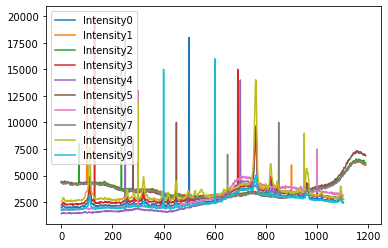

In [57]:
df_sum.plot()

In [88]:
wavelength = np.array(df.index)
for i in range(0,10,1):
     df_inten =df_sum[[f'Intensity{i}']]

,Intensity9
0,1849.328520
1,1822.938040
2,1823.774572
3,1806.205612
4,1753.252927
5,1825.666877
6,1846.271907
7,1828.568171
8,1812.029934
9,1822.742893


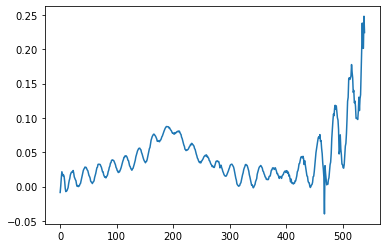

In [13]:
plt.plot(X[0,:])